<a href="https://colab.research.google.com/github/rayeeed/dsps24_Roadrunner1/blob/main/DSPS24_nb2_newDataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install tqdm

In [1]:
import os
cwd = os.getcwd()
print("Current working directory:", cwd)


Current working directory: /home/rayeed/dsps24/dsps24_Roadrunner1


In [2]:
import torch
from fastai.metrics import Metric

# Custom metric for Mean Absolute Percentage Error (MAPE)
class MAPE(Metric):
    def __init__(self):
        self.addition = 0
        self.count = 0
        self.eps = 1e-7  # Small epsilon value

    def reset(self):
        self.addition = 0
        self.count = 0

    def accumulate(self, learn):
        preds, targs = learn.pred, learn.y
        mask = targs != 0  # Ignore cases where the target is zero
        mape = torch.abs((targs - preds) / (targs + self.eps))  # Add eps to avoid division by zero
        mape = mape[mask]  # Apply the mask to ignore zero targets
        self.addition += mape.sum()
        self.count += len(mape)

    @property
    def value(self):
        return self.addition / self.count



In [3]:
from fastai.vision.all import *
import pandas as pd

# Load the data
df = pd.read_csv('../train/train.csv')

# Define the path to the folder containing the images
path = Path('../train/train')


In [4]:
len(df)

7702

In [4]:
# Filter rows with PCI less than zero
df_filtered = df[df['pci'] >= 0]

# Get the list of image names to remove
image_names_to_remove = df[~df.index.isin(df_filtered.index)]['image_name']


# Define the path to the folder containing the images
original_path = Path('../train/train')
backup_path = Path('../train/train_backup')  # Create a backup directory

# Create the backup directory if it doesn't exist
backup_path.mkdir(parents=True, exist_ok=True)

# Move the corresponding image files to the backup directory
for image_name in image_names_to_remove:
    original_image_path = original_path / image_name
    backup_image_path = backup_path / image_name
    if original_image_path.exists():
        os.rename(original_image_path, backup_image_path)
        print(f"Moved {image_name} to the backup directory.")

# Update the dataframe (if needed)
df = df_filtered

In [6]:
len(df)

7685

In [7]:
fns = get_image_files(path)
len(fns)

7685

In [14]:
failed = verify_images(fns)

In [15]:
failed

(#2) [Path('../train/train/11980_(40.6916493333333, -89.4393206666667)_ 2023-10-20 16-10-54_28.5085_D.jpg'),Path('../train/train/1119_(40.7034233333333, -89.4052588333333)_ 2023-10-18 15-49-01_14.30605_D.jpg')]

In [16]:
failed.map(Path.unlink)

(#2) [None,None]

In [5]:
# Define the data block
dblock = DataBlock(blocks=(ImageBlock, RegressionBlock),
                   get_x=ColReader('image_name', pref=path),
                   get_y=ColReader('pci'),
                   splitter=RandomSplitter(valid_pct=0.2, seed=42),
                   item_tfms=RandomResizedCrop(512, min_scale=0.7),
                   batch_tfms=[*aug_transforms(), Normalize.from_stats(*imagenet_stats)])

# Create the dataloader
dls = dblock.dataloaders(df, batch_size=32)

# **resnet**

In [ ]:
# Create the learner
learn = vision_learner(dls, resnet18, metrics=mae, cbs=[EarlyStoppingCallback(patience=2), SaveModelCallback(every_epoch=True,fname='/content/drive/MyDrive/DSPS24/new_dataset/models/resnet18_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(10)

epoch,train_loss,valid_loss,mae,time
0,1150.024414,712.045288,19.439541,16:52


epoch,train_loss,valid_loss,mae,time
0,775.622986,567.206177,17.218147,06:18
1,657.871033,465.446442,15.426736,06:13
2,512.173401,417.617645,15.458614,06:16
3,421.357391,328.259552,13.645597,06:21
4,390.635742,331.219940,13.932341,06:24
5,354.689148,285.918701,12.370468,06:21
6,313.644012,290.387329,12.119604,06:23
7,291.956818,283.793701,12.262146,06:21
8,269.747925,262.093140,11.457990,06:24
9,255.537170,262.690613,11.331676,06:23


epoch,train_loss,valid_loss,mae,time
0,1076.764648,834.256775,20.438799,01:03


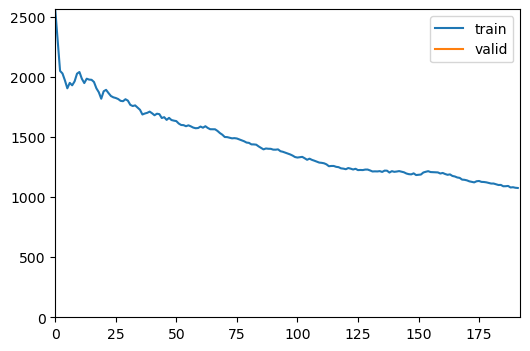

epoch,train_loss,valid_loss,mae,time
0,857.552429,612.723145,17.559944,01:19
1,739.821350,540.458740,16.362907,01:20
2,648.387207,472.191681,15.398991,01:21
3,584.431091,440.643250,14.691942,01:17
4,532.903931,373.931030,13.526796,01:15
5,493.787048,379.036163,13.971872,01:15
6,459.085541,341.223785,13.090250,01:15
7,439.501129,330.333435,13.263803,01:15
8,368.464325,302.921661,12.844273,01:15
9,361.193695,293.135620,12.437261,01:15


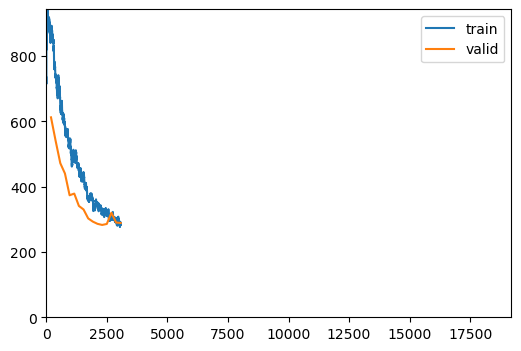

No improvement since epoch 11: early stopping


In [11]:
# Create the learner
learn = vision_learner(dls, resnet18, metrics=mae, cbs=[EarlyStoppingCallback(patience=5), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet18_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(100)

/home/rayeed/mambaforge/lib/python3.10/site-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


epoch,train_loss,valid_loss,mae,time
0,265.208160,301.561981,12.130603,01:02


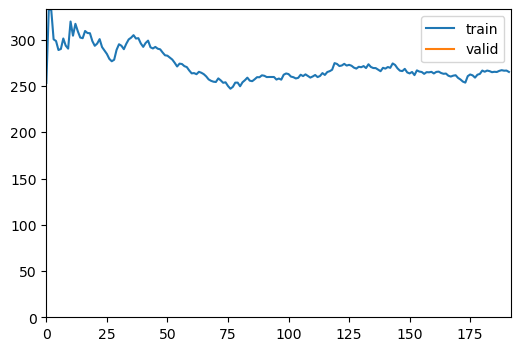

epoch,train_loss,valid_loss,mae,time
0,246.249298,285.768829,11.608254,01:15
1,226.159775,268.905762,11.317229,01:14
2,225.829697,265.640930,11.363139,01:15
3,235.253265,265.686768,11.406606,01:15
4,219.872711,286.926575,11.581345,01:15
5,211.369080,264.245880,11.188451,01:15
6,205.143463,266.741333,11.054339,01:15
7,214.046082,255.700027,11.039388,01:15
8,201.703568,276.597809,11.340947,01:15
9,205.562286,278.362244,11.610267,01:15


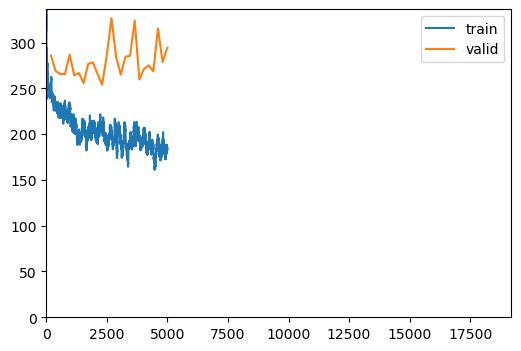

No improvement since epoch 11: early stopping


In [12]:
# Create the learner
learn = vision_learner(dls, resnet18, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet18_model')],y_range=(-0.5,100.5))
learn.load('resnet18_model_15')
# Train the model
learn.fine_tune(100)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 96.2MB/s]


epoch,train_loss,valid_loss,mae,time
0,1104.079468,971.065247,22.505672,27:47


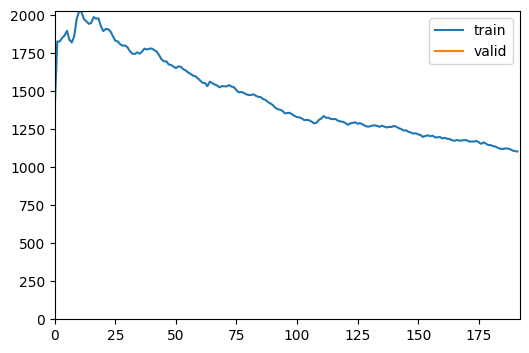

epoch,train_loss,valid_loss,mae,time
0,812.040955,578.992859,17.284164,06:33
1,651.878845,454.055420,15.467835,06:40
2,476.862823,373.299683,14.408132,06:37
3,410.368958,302.488770,12.644106,06:35
4,378.946777,318.525299,13.224685,06:34
5,338.947113,305.520447,12.374428,06:31


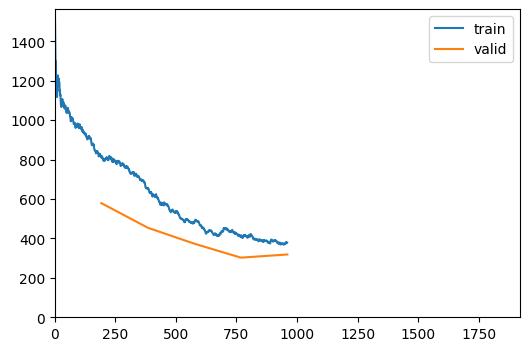

No improvement since epoch 3: early stopping


In [ ]:
# Create the learner
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=2), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='/content/drive/MyDrive/DSPS24/new_dataset/models/resnet34_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(10)

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


epoch,train_loss,valid_loss,mae,time
0,384.479065,304.294434,12.409938,05:44


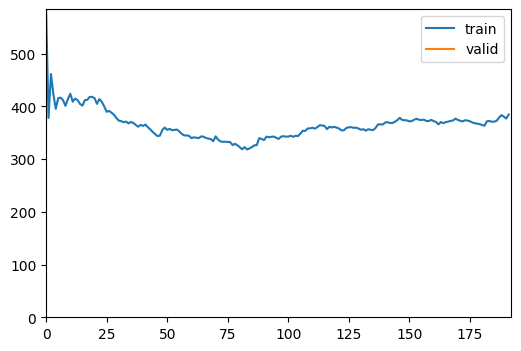

epoch,train_loss,valid_loss,mae,time
0,336.617249,288.257416,12.117302,05:59
1,345.817871,304.538483,12.399493,05:55
2,373.095093,287.691711,12.047799,05:54
3,369.965607,330.329742,13.547834,05:54
4,319.202484,285.178101,12.102740,05:54
5,293.514191,262.962677,11.193576,05:55
6,262.239990,237.859879,10.705310,06:02


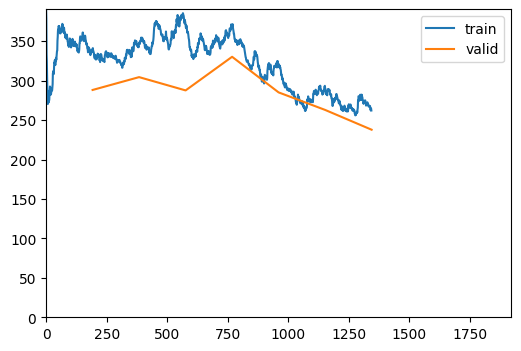

In [ ]:
# Create the learner
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=3), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='/content/drive/MyDrive/DSPS24/new_dataset/models/resnet34_model')],y_range=(-0.5,100.5))
learn=learn.load('/content/drive/MyDrive/DSPS24/new_dataset/models/resnet34_model_3')
# Train the model
learn.fine_tune(10)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 141MB/s]
/usr/local/lib/python3.10/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


epoch,train_loss,valid_loss,mae,time
0,243.844955,237.220261,10.680265,22:18


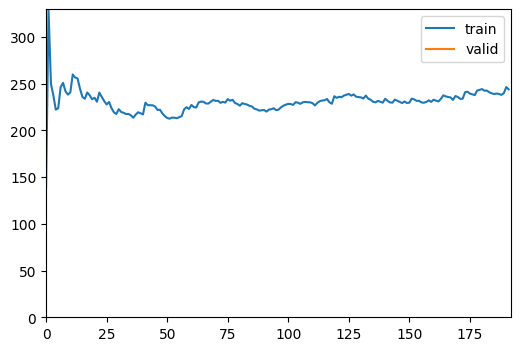

epoch,train_loss,valid_loss,mae,time
0,229.020782,232.320190,10.673015,07:25
1,272.980927,278.233459,11.974396,07:27


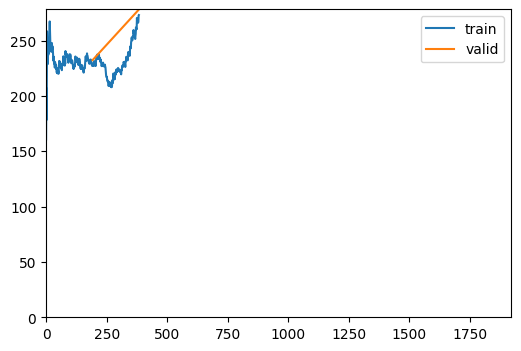

epoch,train_loss,valid_loss,mae,time
0,229.020782,232.320190,10.673015,07:25
1,272.980927,278.233459,11.974396,07:27
2,269.649200,288.452820,12.184446,07:18
3,256.146057,268.872284,11.469499,07:18


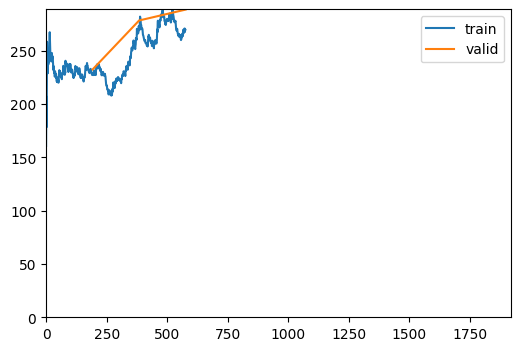

No improvement since epoch 0: early stopping


In [ ]:
# Create the learner
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=3), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='/content/drive/MyDrive/DSPS24/new_dataset/models/resnet34_model')],y_range=(-0.5,100.5))
learn=learn.load('/content/drive/MyDrive/DSPS24/new_dataset/models/resnet34_model_6')
# Train the model
learn.fine_tune(100)

In [ ]:
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=3), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='/content/drive/MyDrive/DSPS24/new_dataset/models/resnet34_model')],y_range=(-0.5,100.5))
learn=learn.load('/content/drive/MyDrive/DSPS24/new_dataset/models/resnet34_model_0')

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 149MB/s]
/usr/local/lib/python3.10/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


In [ ]:
## use gdown in google collab to download the test data.
## if gdown fails, click on output link from gdown to download data directly from browser

!gdown --id '1KdNjCIot9SYh9JxRHuCjrPdmgUDazZ9U'

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1KdNjCIot9SYh9JxRHuCjrPdmgUDazZ9U
From (redirected): https://drive.google.com/uc?id=1KdNjCIot9SYh9JxRHuCjrPdmgUDazZ9U&confirm=t&uuid=b004ab64-a660-42e2-b160-bde99b61a700
To: /content/test.zip
100% 2.92G/2.92G [00:39<00:00, 74.7MB/s]


In [ ]:
## use unzip in google collab to extract zipped training data to current directory.
!unzip '/content/test.zip' -d './'

Archive:  /content/test.zip
   creating: ./test/
  inflating: ./test/3910_[40.70800769388502, -89.38938456054692]_ 2023-10-18 16-18-59_22.8697_LD.jpg  
  inflating: ./test/6780_(40.7029723333333, -89.4051231666667)_ 2023-10-18 17-02-15_4.22725_D.jpg  
  inflating: ./test/1101_(40.7033468333333, -89.40616)_ 2023-10-18 15-48-47_16.61855_D.jpg  
  inflating: ./test/20513_(40.7089811666667, -89.4348416666667)_ 2023-10-20 19-10-05_2.42905_D.jpg  
  inflating: ./test/40399_[40.71426820356199, -89.43796371571018]_ 2023-10-20 15-30-41_16.81465_LD.jpg  
  inflating: ./test/46049_(40.7022096666667, -89.4174218333333)_ 2023-10-20 19-53-28_33.02435_D.jpg  
  inflating: ./test/13181_(40.6990283333333, -89.4438793333334)_ 2023-10-20 16-23-39_27.63715_D.jpg  
  inflating: ./test/9211_(40.7292421666667, -89.4384211666667)_ 2023-10-18 20-17-08_25.84265_D.jpg  
  inflating: ./test/32770_[40.7163773348367, -89.41645742478786]_ 2023-10-18 19-10-20_22.4405_LD.jpg  
  inflating: ./test/38808_[40.72804633333

In [ ]:
test_path = Path('/content/test')
rows = []
for tst_img in test_path.glob('**/*.jpg'):
    preds = learn.predict(tst_img)
    pred_value = preds[0] # Extract the predicted value from the tuple
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

df_test = pd.DataFrame(rows)


OSError: image file is truncated (51 bytes not processed)

In [ ]:
rows

[{'image_name': '22012_(40.711165, -89.4175438333333)_ 2023-10-20 19-25-31_38.05265_D.jpg',
  'pci': (50.81731033325195)},
 {'image_name': '41746_[40.70614007472357, -89.46156310588547]_ 2023-10-20 16-41-33_43.72845_LD.jpg',
  'pci': (89.54842376708984)},
 {'image_name': '49828_(40.7251871666667, -89.450205)_ 2023-10-18 20-44-13_41.62315_D.jpg',
  'pci': (83.240966796875)},
 {'image_name': '41745_(40.7061928333333, -89.4615401666667)_ 2023-10-20 16-41-33_42.7535_D.jpg',
  'pci': (72.97431945800781)},
 {'image_name': '10182_[40.72264570485108, -89.43713733540167]_ 2023-10-18 20-26-26_36.0972_LD.jpg',
  'pci': (45.034767150878906)},
 {'image_name': '19616_(40.7051068333333, -89.445311)_ 2023-10-20 19-00-55_25.50965_D.jpg',
  'pci': (2.6074228286743164)},
 {'image_name': '16218_[40.69515830276954, -89.4836795817025]_ 2023-10-20 17-29-30_45.90775_LD.jpg',
  'pci': (50.37297821044922)},
 {'image_name': '5357_[40.70442358493407, -89.39374919306383]_ 2023-10-18 16-34-03_35.4682_LD.jpg',
  'pc

In [ ]:
fns_test = get_image_files('/content/test')
len(fns_test)
failed_test = verify_images(fns_test)

In [ ]:
failed_test

(#1) [Path('/content/test/13143_(40.6993196666667, -89.4439158333333)_ 2023-10-20 16-23-15_28.2717_D.jpg')]

In [ ]:
failed_test.map(test_path.unlink)

IsADirectoryError: [Errno 21] Is a directory: '/content/test'

In [ ]:
from tqdm import tqdm

test_path = Path('/content/test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 10)
pbar.close()

df_test = pd.DataFrame(rows)



  0%|          | 0/3302 [00:00<?, ?it/s]

  6%|▌         | 200/3302 [00:42<10:52,  4.75it/s]



  3%|▎         | 100/3302 [00:10<05:44,  9.29it/s]


  6%|▌         | 200/3302 [00:23<06:04,  8.50it/s]


  9%|▉         | 300/3302 [00:36<06:14,  8.02it/s]


 12%|█▏        | 400/3302 [00:50<06:14,  7.76it/s]


 15%|█▌        | 500/3302 [01:04<06:21,  7.35it/s]


 18%|█▊        | 600/3302 [01:18<06:10,  7.29it/s]


 21%|██        | 700/3302 [01:32<05:56,  7.30it/s]


 24%|██▍       | 800/3302 [01:46<05:48,  7.18it/s]


 27%|██▋       | 900/3302 [02:00<05:31,  7.26it/s]


 30%|███       | 1000/3302 [02:14<05:17,  7.26it/s]


 33%|███▎      | 1100/3302 [02:28<05:05,  7.20it/s]


 36%|███▋      | 1200/3302 [02:41<04:48,  7.30it/s]


 39%|███▉      | 1300/3302 [02:55<04:38,  7.19it/s]


 42%|████▏     | 1400/3302 [03:09<04:21,  7.26it/s]


 45%|████▌     | 1500/3302 [03:23<04:08,  7.26it/s]


 48%|████▊     | 1600/3302 [03:37<03:56,  7.19it/s]


 51%|█████▏    | 1700/3302 [03:51<03:41,  7.24it/s]


 55%|█████▍    | 1800/3302 [04:04<03:25,  7.33it/s]


 58%|█████▊    | 1900/3302 [04:17<03:11,  7.32it/s]


 61%|██████    | 2000/3302 [04:32<02:59,  7.25it/s]


 64%|██████▎   | 2100/3302 [04:45<02:43,  7.34it/s]


 67%|██████▋   | 2200/3302 [04:59<02:30,  7.32it/s]


 70%|██████▉   | 2300/3302 [05:13<02:17,  7.26it/s]


 73%|███████▎  | 2400/3302 [05:26<02:03,  7.30it/s]


 76%|███████▌  | 2500/3302 [05:39<01:49,  7.35it/s]


 79%|███████▊  | 2600/3302 [05:53<01:35,  7.35it/s]


 82%|████████▏ | 2700/3302 [06:07<01:22,  7.28it/s]


 85%|████████▍ | 2800/3302 [06:21<01:09,  7.27it/s]


 88%|████████▊ | 2900/3302 [06:34<00:54,  7.34it/s]


 91%|█████████ | 3000/3302 [06:48<00:40,  7.37it/s]


 94%|█████████▍| 3100/3302 [07:01<00:27,  7.35it/s]


 97%|█████████▋| 3200/3302 [07:15<00:13,  7.41it/s]


100%|█████████▉| 3300/3302 [07:28<00:00,  7.41it/s]


6600it [07:28, 14.70it/s] 


In [ ]:
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)

In [ ]:
df_test

,image_name,pci
0,"22012_(40.711165, -89.4175438333333)_ 2023-10-20 19-25-31_38.05265_D.jpg","(50.81731033325195,)"
1,"41746_[40.70614007472357, -89.46156310588547]_ 2023-10-20 16-41-33_43.72845_LD.jpg","(89.54842376708984,)"
2,"49828_(40.7251871666667, -89.450205)_ 2023-10-18 20-44-13_41.62315_D.jpg","(83.240966796875,)"
3,"41745_(40.7061928333333, -89.4615401666667)_ 2023-10-20 16-41-33_42.7535_D.jpg","(72.97431945800781,)"
4,"10182_[40.72264570485108, -89.43713733540167]_ 2023-10-18 20-26-26_36.0972_LD.jpg","(45.034767150878906,)"
...,...,...
3297,"60247_[40.695024225459534, -89.45922843374856]_ 2023-10-20 18-33-51_34.58205_LD.jpg","(31.756916046142578,)"
3298,"5415_[40.70265555656423, -89.39300558447563]_ 2023-10-18 16-34-35_27.12285_LD.jpg","(86.5611343383789,)"
3299,"41000_[40.718547784253595, -89.44038761423936]_ 2023-10-20 15-36-16_24.5606_LD.jpg","(21.89426612854004,)"
3300,"14241_[40.7043359193157, -89.45409458208992]_ 2023-10-20 16-35-18_63.26815_LD.jpg","(34.60654067993164,)"


In [ ]:

gen_submit(df_test)

In [ ]:
fns_test = get_image_files('/content/drive/MyDrive/DSPS24/new_dataset/test/test')

failed_test = verify_images(fns_test)

failed_test

(#1) [Path('/content/drive/MyDrive/DSPS24/new_dataset/test/test/13143_(40.6993196666667, -89.4439158333333)_ 2023-10-20 16-23-15_28.2717_D.jpg')]

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /home/rayeed/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████████████████████████████████████████████████████████████| 83.3M/83.3M [00:08<00:00, 9.73MB/s]


epoch,train_loss,valid_loss,mae,time
0,1167.454102,946.502197,22.699829,01:36


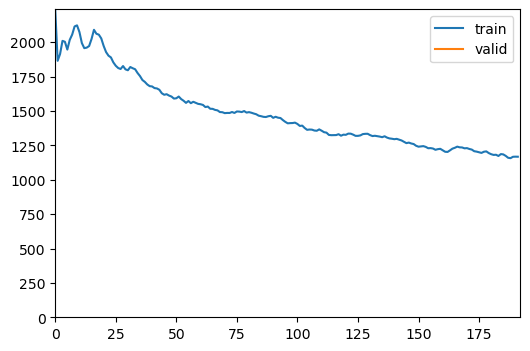

epoch,train_loss,valid_loss,mae,time
0,866.520081,661.796265,17.928581,04:32
1,743.071472,480.673096,15.365284,04:32
2,628.561890,461.848358,15.153382,04:31
3,562.545471,381.153381,13.802153,04:30
4,505.171722,341.049988,13.022202,04:30
5,461.628204,346.207458,13.165350,04:30
6,410.670349,308.025055,12.741592,04:30
7,378.191956,309.123322,12.421944,04:30
8,374.021973,308.060211,12.528805,04:30
9,330.335022,312.131592,13.159097,04:30


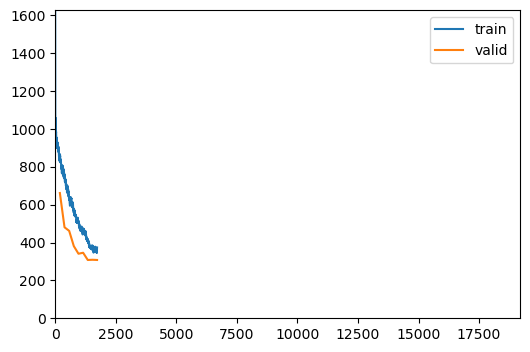

No improvement since epoch 6: early stopping


In [18]:
# Create the learner
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=3), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='../resnet34_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(100)

/home/rayeed/mambaforge/lib/python3.10/site-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


epoch,train_loss,valid_loss,mae,time
0,404.601807,326.222626,13.297219,01:33


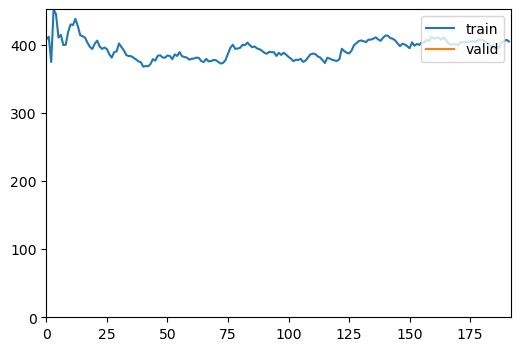

epoch,train_loss,valid_loss,mae,time
0,345.832397,301.188293,12.834439,04:14
1,335.315552,293.723297,12.446116,04:13
2,325.316650,295.135895,12.291926,04:13
3,293.108154,291.604675,12.250469,02:52
4,286.343842,279.622162,11.761275,02:52
5,287.826996,277.145386,11.897857,02:51
6,262.994751,284.051758,11.955605,02:52
7,263.264618,262.356201,11.551175,03:35
8,264.850861,280.578918,11.807163,03:32
9,248.137863,302.449646,12.056070,04:22


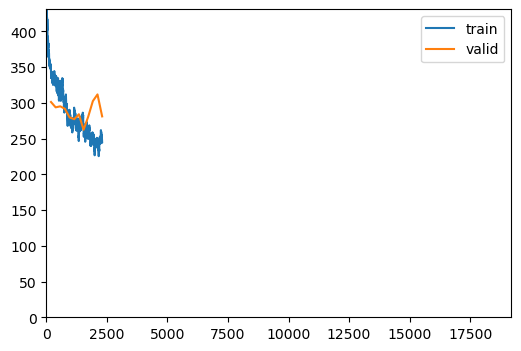

No improvement since epoch 7: early stopping


In [14]:
# Create the learner
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=5), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='../resnet34_model')],y_range=(-0.5,100.5))
learn=learn.load('../resnet34_model_6')
# Train the model
learn.fine_tune(100)

epoch,train_loss,valid_loss,mae,time
0,216.564865,300.643494,11.953680,01:30


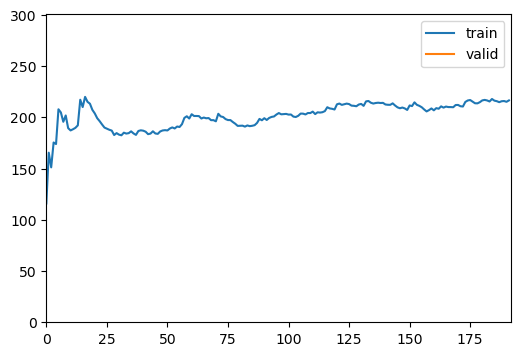

epoch,train_loss,valid_loss,mae,time
0,210.711472,274.418518,11.468196,01:52
1,188.415298,256.095215,10.974151,01:53
2,179.790802,259.358276,10.917369,01:53
3,180.221344,268.448883,10.956527,01:53
4,168.543747,265.510590,11.281147,01:53
5,164.507767,267.628754,11.086701,01:53
6,158.427704,277.915710,11.232961,01:53
7,162.863419,287.632629,11.345483,01:53
8,170.395935,268.619690,10.855526,01:53
9,166.477554,271.255219,10.906957,01:57


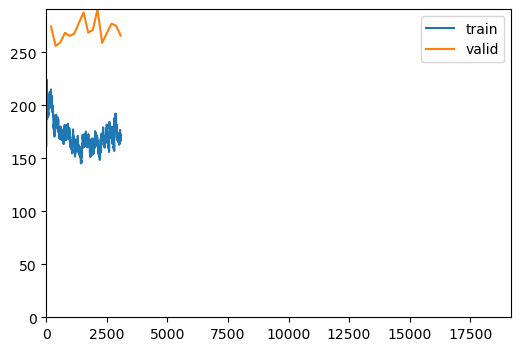

No improvement since epoch 1: early stopping


In [17]:
# Create the learner
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='../resnet34_model')],y_range=(-0.5,100.5))
learn=learn.load('../resnet34_model_12')
# Train the model
learn.fine_tune(100)

# **xresnet**

Downloading: "https://s3.amazonaws.com/fast-ai-modelzoo/xrn50_940.pth" to /root/.cache/torch/hub/checkpoints/xrn50_940.pth
100%|██████████| 244M/244M [00:04<00:00, 58.3MB/s]


epoch,train_loss,valid_loss,mae,time
0,1185.046021,824.506409,20.910170,10:55


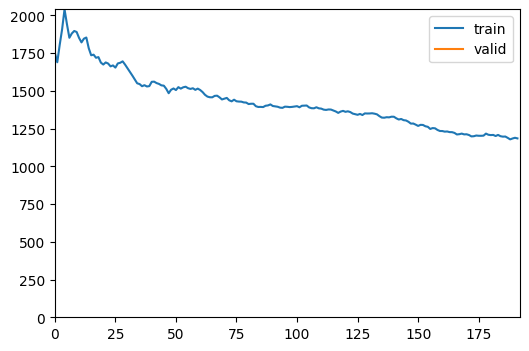

epoch,train_loss,valid_loss,mae,time
0,892.656860,737.200317,19.915873,06:13
1,818.601196,626.841309,18.605915,06:17
2,687.956970,538.315796,17.969330,06:15
3,649.722656,507.441864,17.244774,06:17
4,577.446228,482.947754,16.986153,06:12
5,551.268188,519.846069,18.094566,06:11
6,505.044189,447.281647,16.393385,06:14
7,477.482208,469.432281,16.545639,06:14


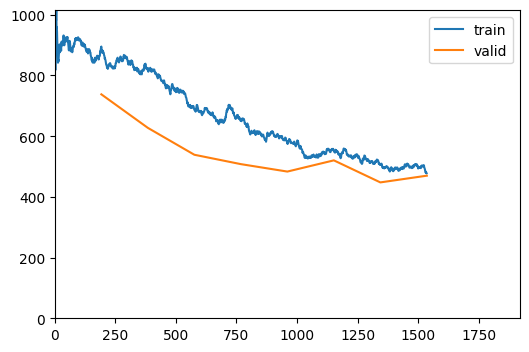

In [ ]:
# Create the learner
learn = vision_learner(dls, xresnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=2), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='/content/drive/MyDrive/DSPS24/new_dataset/models/xresnet34_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(10)

epoch,train_loss,valid_loss,mae,time
0,1144.987549,1119.104126,24.730253,01:15


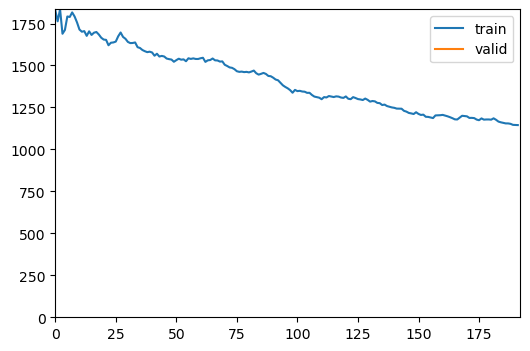

epoch,train_loss,valid_loss,mae,time
0,908.121765,704.973083,19.696804,01:30
1,813.966675,658.598389,19.266146,01:32
2,779.164185,607.560120,18.324924,01:31
3,718.934631,621.801086,18.934336,01:32
4,659.666138,525.111511,17.265814,01:31
5,648.275452,609.589722,18.496721,01:32
6,636.166626,530.037109,17.730730,01:36
7,593.229736,470.027069,16.737869,01:35
8,562.526001,462.522766,16.569891,01:32
9,520.828613,443.864197,16.990707,01:34


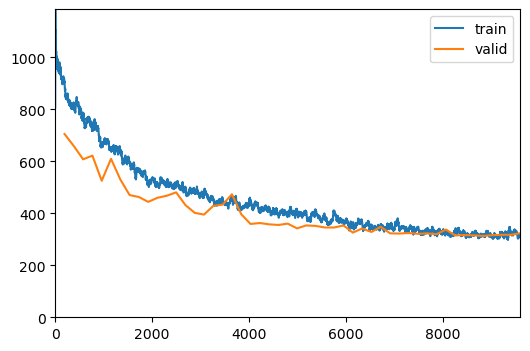

In [16]:
# Create the learner
learn = vision_learner(dls, xresnet18, metrics=mae, cbs=[EarlyStoppingCallback(patience=10), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='xresnet18_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(50)

In [1]:
from fastai.vision.all import Resize
from tqdm import tqdm

test_path = Path('../test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        #tst_img = Resize(512)(tst_img)
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 100)
pbar.close()

df_test = pd.DataFrame(rows)
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)

gen_submit(df_test)

NameError: name 'Path' is not defined

In [7]:
from fastai.vision.all import Resize
from tqdm import tqdm

test_path = Path('../test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
learn = vision_learner(dls, xresnet18, metrics=mae, cbs=[EarlyStoppingCallback(patience=10), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='xresnet18_model')],y_range=(-0.5,100.5))
learn.load('xresnet18_model_49')
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        tst_img = Resize(512)(tst_img)
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 100)
pbar.close()

df_test = pd.DataFrame(rows)
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)

gen_submit(df_test)


  0%|                                                                              | 0/3302 [00:28<?, ?it/s]
/home/rayeed/mambaforge/lib/python3.10/site-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")



  3%|██                                                                  | 100/3302 [00:10<05:27,  9.77it/s]


  6%|████                                                                | 200/3302 [00:19<04:51, 10.62it/s]


  9%|██████▏                                                             | 300/3302 [00:26<04:13, 11.82it/s]


 12%|████████▏                                                           | 400/3302 [00:34<03:57, 12.21it/s]


 15%|██████████▎                                                         | 500/3302 [00:42<03:46, 12.35it/s]


 18%|████████████▎                                                       | 600/3302 [00:49<03:33, 12.66it/s]


 21%|██████████████▍                                                     | 700/3302 [00:58<03:33, 12.18it/s]


 24%|████████████████▍                                                   | 800/3302 [01:06<03:20, 12.51it/s]


 27%|██████████████████▌                                                 | 900/3302 [01:13<03:11, 12.53it/s]


 30%|████████████████████▎                                              | 1000/3302 [01:21<02:57, 12.95it/s]


 33%|██████████████████████▎                                            | 1100/3302 [01:29<02:55, 12.55it/s]


 36%|████████████████████████▎                                          | 1200/3302 [01:37<02:49, 12.43it/s]


 39%|██████████████████████████▍                                        | 1300/3302 [01:46<02:46, 12.02it/s]


 42%|████████████████████████████▍                                      | 1400/3302 [01:55<02:42, 11.70it/s]


 45%|██████████████████████████████▍                                    | 1500/3302 [02:02<02:25, 12.35it/s]


 48%|████████████████████████████████▍                                  | 1600/3302 [02:10<02:16, 12.47it/s]


 51%|██████████████████████████████████▍                                | 1700/3302 [02:18<02:05, 12.76it/s]


 55%|████████████████████████████████████▌                              | 1800/3302 [02:26<01:59, 12.59it/s]


 58%|██████████████████████████████████████▌                            | 1900/3302 [02:34<01:52, 12.51it/s]


 61%|████████████████████████████████████████▌                          | 2000/3302 [02:42<01:44, 12.45it/s]


 64%|██████████████████████████████████████████▌                        | 2100/3302 [02:49<01:34, 12.76it/s]


 67%|████████████████████████████████████████████▋                      | 2200/3302 [02:57<01:24, 13.00it/s]


 70%|██████████████████████████████████████████████▋                    | 2300/3302 [03:04<01:16, 13.14it/s]


 73%|████████████████████████████████████████████████▋                  | 2400/3302 [03:12<01:07, 13.27it/s]


 76%|██████████████████████████████████████████████████▋                | 2500/3302 [03:20<01:01, 12.96it/s]


 79%|████████████████████████████████████████████████████▊              | 2600/3302 [03:28<00:55, 12.55it/s]


 82%|██████████████████████████████████████████████████████▊            | 2700/3302 [03:37<00:50, 12.04it/s]


 85%|████████████████████████████████████████████████████████▊          | 2800/3302 [03:46<00:42, 11.74it/s]


 88%|██████████████████████████████████████████████████████████▊        | 2900/3302 [03:56<00:34, 11.51it/s]


 91%|████████████████████████████████████████████████████████████▊      | 3000/3302 [04:05<00:26, 11.39it/s]


 94%|██████████████████████████████████████████████████████████████▉    | 3100/3302 [04:12<00:16, 12.02it/s]


 97%|████████████████████████████████████████████████████████████████▉  | 3200/3302 [04:20<00:08, 12.21it/s]


100%|██████████████████████████████████████████████████████████████████▉| 3300/3302 [04:28<00:00, 12.09it/s]


6600it [04:28, 24.55it/s]                                                                                   


# **Alexnet**

In [11]:
# Create the learner
learn = vision_learner(dls, alexnet, metrics=mae, cbs=[EarlyStoppingCallback(patience=5), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='models/alexnet_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(50)

epoch,train_loss,valid_loss,mae,time


KeyboardInterrupt: 

epoch,train_loss,valid_loss,mae,time
0,316.946472,294.117218,13.018305,00:39


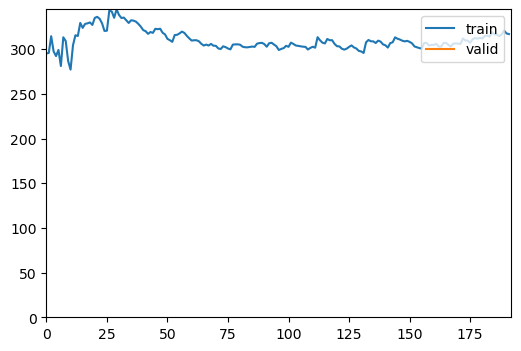

epoch,train_loss,valid_loss,mae,time
0,290.017700,282.654999,12.372083,00:40
1,275.555969,275.050476,11.793084,00:43
2,284.089905,284.033295,12.356926,00:44
3,279.488556,280.750977,12.126046,00:49
4,274.780853,280.527130,12.255426,00:46
5,270.340729,286.203918,12.141828,00:43
6,265.169556,276.072449,11.823420,00:43


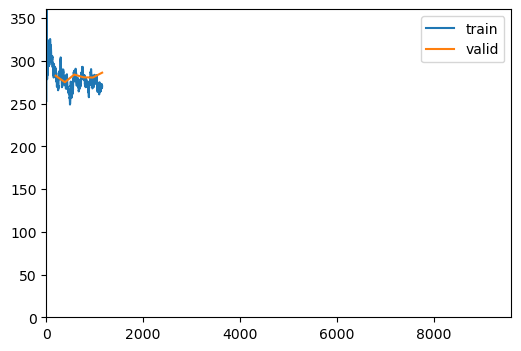

No improvement since epoch 1: early stopping


In [11]:
# Create the learner
learn = vision_learner(dls, alexnet, metrics=mae, cbs=[EarlyStoppingCallback(patience=5), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='alexnet_model')],y_range=(-0.5,100.5))
learn.load('model_17')
# Train the model
learn.fine_tune(50)

In [13]:
from fastai.vision.all import Resize
from tqdm import tqdm

test_path = Path('../test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        tst_img = Resize(512)(tst_img)
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 10)
pbar.close()

df_test = pd.DataFrame(rows)
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)


 24%|████████████████▍                                                   | 800/3302 [01:39<05:12,  8.00it/s]



  3%|██                                                                  | 100/3302 [00:06<03:35, 14.86it/s]


  6%|████                                                                | 200/3302 [00:13<03:20, 15.47it/s]


  9%|██████▏                                                             | 300/3302 [00:19<03:14, 15.40it/s]


 12%|████████▏                                                           | 400/3302 [00:26<03:08, 15.36it/s]


 15%|██████████▎                                                         | 500/3302 [00:32<03:01, 15.48it/s]


 18%|████████████▎                                                       | 600/3302 [00:38<02:54, 15.49it/s]


 21%|██████████████▍                                                     | 700/3302 [00:45<02:49, 15.37it/s]


 24%|████████████████▍                                                   | 800/3302 [00:51<02:42, 15.38it/s]


 27%|██████████████████▌                                                 | 900/3302 [00:58<02:34, 15.53it/s]


 30%|████████████████████▎                                              | 1000/3302 [01:04<02:27, 15.59it/s]


 33%|██████████████████████▎                                            | 1100/3302 [01:11<02:26, 14.99it/s]


 36%|████████████████████████▎                                          | 1200/3302 [01:18<02:19, 15.03it/s]


 39%|██████████████████████████▍                                        | 1300/3302 [01:25<02:15, 14.82it/s]


 42%|████████████████████████████▍                                      | 1400/3302 [01:32<02:09, 14.70it/s]


 45%|██████████████████████████████▍                                    | 1500/3302 [01:39<02:03, 14.60it/s]


 48%|████████████████████████████████▍                                  | 1600/3302 [01:46<01:59, 14.29it/s]


 51%|██████████████████████████████████▍                                | 1700/3302 [01:54<01:53, 14.06it/s]


 55%|████████████████████████████████████▌                              | 1800/3302 [02:00<01:44, 14.33it/s]


 58%|██████████████████████████████████████▌                            | 1900/3302 [02:07<01:35, 14.67it/s]


 61%|████████████████████████████████████████▌                          | 2000/3302 [02:14<01:30, 14.37it/s]


 64%|██████████████████████████████████████████▌                        | 2100/3302 [02:21<01:24, 14.20it/s]


 67%|████████████████████████████████████████████▋                      | 2200/3302 [02:28<01:17, 14.23it/s]


 70%|██████████████████████████████████████████████▋                    | 2300/3302 [02:36<01:12, 13.76it/s]


 73%|████████████████████████████████████████████████▋                  | 2400/3302 [02:43<01:05, 13.81it/s]


 76%|██████████████████████████████████████████████████▋                | 2500/3302 [02:50<00:57, 14.06it/s]


 79%|████████████████████████████████████████████████████▊              | 2600/3302 [02:57<00:48, 14.45it/s]


 82%|██████████████████████████████████████████████████████▊            | 2700/3302 [03:03<00:40, 14.80it/s]


 85%|████████████████████████████████████████████████████████▊          | 2800/3302 [03:09<00:32, 15.25it/s]


 88%|██████████████████████████████████████████████████████████▊        | 2900/3302 [03:16<00:27, 14.74it/s]


 91%|████████████████████████████████████████████████████████████▊      | 3000/3302 [03:23<00:20, 14.90it/s]


 94%|██████████████████████████████████████████████████████████████▉    | 3100/3302 [03:30<00:13, 14.69it/s]


 97%|████████████████████████████████████████████████████████████████▉  | 3200/3302 [03:37<00:07, 14.44it/s]


100%|██████████████████████████████████████████████████████████████████▉| 3300/3302 [03:44<00:00, 14.49it/s]


6600it [03:44, 29.38it/s]                                                                                   


In [14]:

gen_submit(df_test)

In [ ]:
# Create the learner
learn = vision_learner(dls, alexnet, metrics=mae, cbs=[EarlyStoppingCallback(patience=2), SaveModelCallback(every_epoch=True,fname='/content/drive/MyDrive/DSPS24/alexnet_model')],y_range=(-0.5,100.5))
learn=learn.load('/content/models/model_4')
# Train the model
learn.fine_tune(5)

/usr/local/lib/python3.10/dist-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


epoch,train_loss,valid_loss,mae,time
0,237.616714,228.023376,10.530666,06:44


epoch,train_loss,valid_loss,mae,time
0,238.597000,231.340149,10.628124,06:49
1,231.826797,259.350800,11.820428,06:48
2,209.183945,248.498062,11.694738,06:55


No improvement since epoch 0: early stopping


In [ ]:
# Create the learner
learn = vision_learner(dls, alexnet, metrics=mae, cbs=[EarlyStoppingCallback(patience=5), SaveModelCallback(every_epoch=True)],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(50)

# **squeezenet**

Downloading: "https://download.pytorch.org/models/squeezenet1_0-b66bff10.pth" to /home/rayeed/.cache/torch/hub/checkpoints/squeezenet1_0-b66bff10.pth
100%|██████████████████████████████████████████████████████████████████| 4.78M/4.78M [00:00<00:00, 5.35MB/s]


epoch,train_loss,valid_loss,mae,time
0,1072.488892,871.150513,21.142818,03:03


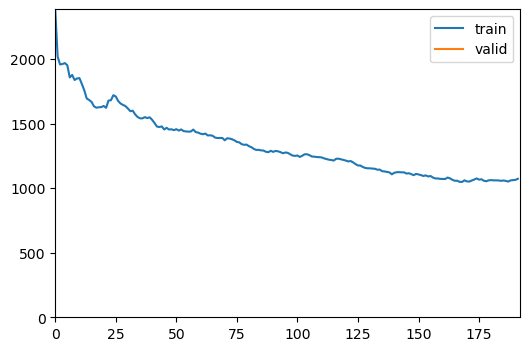

epoch,train_loss,valid_loss,mae,time
0,821.892822,565.197083,17.211962,16:53
1,727.142151,457.978882,15.384396,16:39
2,699.165771,435.283356,15.019030,16:25
3,634.841919,403.436798,14.792608,16:28


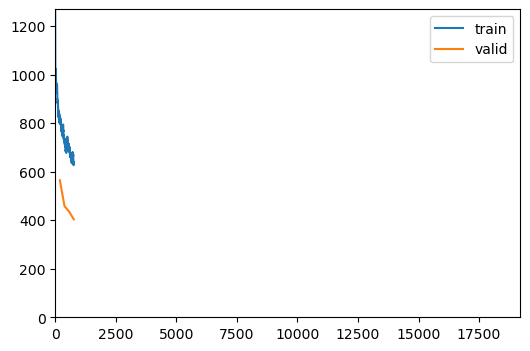

In [ ]:
# Create the learner
learn = vision_learner(dls, squeezenet1_0, metrics=mae, cbs=[EarlyStoppingCallback(patience=5), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='../squeezenet_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(100)

In [23]:
# Create the learner
learn = vision_learner(dls, squeezenet1_0, metrics=mae, cbs=[EarlyStoppingCallback(patience=10), SaveModelCallback(every_epoch=True,fname='../squeezenet1_0')],y_range=(-0.5,100.5))
learn=learn.load('../squeezenet_model_3')

# Train the model for two more epochs
learn.fine_tune(50)

epoch,train_loss,valid_loss,mae,time
0,652.764648,467.396057,16.017479,02:47


epoch,train_loss,valid_loss,mae,time
0,495.190033,369.878021,14.356848,07:43
1,489.495850,359.476013,14.584657,07:39
2,446.043396,348.549255,13.765353,07:42
3,444.128296,337.620514,13.770288,07:39
4,398.104126,339.451782,13.826595,07:40


KeyboardInterrupt: 

/home/rayeed/mambaforge/lib/python3.10/site-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


epoch,train_loss,valid_loss,mae,time
0,426.887024,396.972626,15.323978,00:47


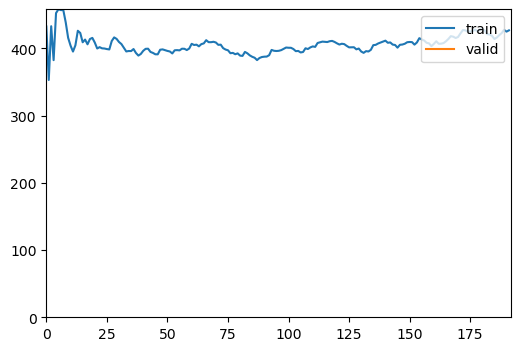

epoch,train_loss,valid_loss,mae,time
0,382.943390,319.755249,13.409728,05:43
1,377.858215,345.279877,14.717588,05:41
2,372.996765,314.396179,13.441400,05:44
3,342.896210,311.579590,13.153731,05:41
4,372.691711,315.739166,13.518359,05:41
5,347.278992,312.240173,12.674781,05:49
6,342.448853,325.366943,12.961245,06:26
7,321.646118,314.669373,12.941239,06:20
8,330.991364,364.812042,14.907171,05:52
9,358.692780,309.813263,13.098968,05:51


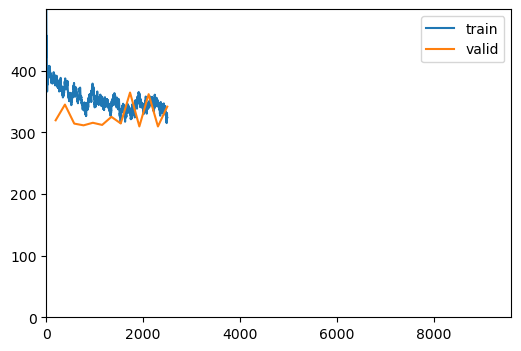

KeyboardInterrupt: 

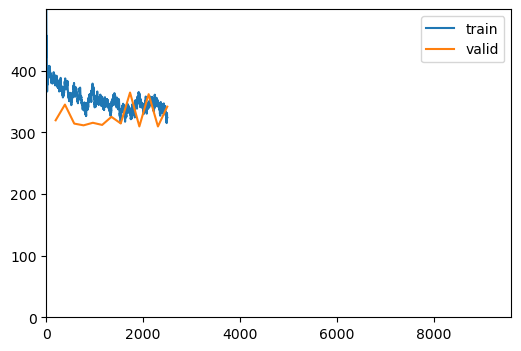

In [10]:
# Create the learner
learn = vision_learner(dls, squeezenet1_0, metrics=mae, cbs=[EarlyStoppingCallback(patience=10), ShowGraphCallback(), SaveModelCallback(every_epoch=True,fname='../squeezenet1_0')],y_range=(-0.5,100.5))
learn=learn.load('../squeezenet1_0_4')

# Train the model for two more epochs
learn.fine_tune(50)

# **Efficient Net**

epoch,train_loss,valid_loss,mae,time
0,1098.196899,801.137451,20.037268,10:43


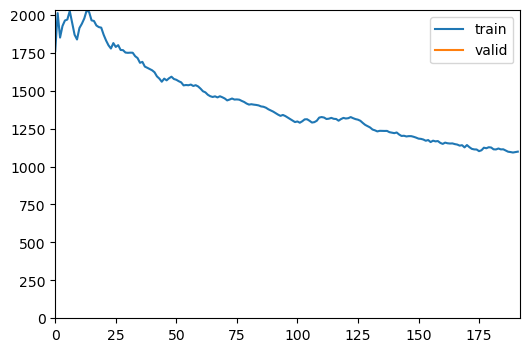

epoch,train_loss,valid_loss,mae,time


In [ ]:

# Create the learner
learn = vision_learner(dls, googlenet, metrics=mae, cbs=[EarlyStoppingCallback(patience=10), ShowGraphCallback(), SaveModelCallback(every_epoch=True, fname='../googlenet')], y_range=(-0.5, 100.5))

learn.fine_tune(50)

In [21]:
model = EfficientNet.from_pretrained('efficientnet-b0')


Loaded pretrained weights for efficientnet-b0
